<a target="_blank" href="https://colab.research.google.com/github/jmanuelc87/nmp-autoavanza/blob/main/notebooks/MontePiedad_EDA_02.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [ ]:
import os
import cv2
import glob
import math
import fitz
import pytesseract as pyt

import numpy as np
import matplotlib.pyplot as plt

from transformers import pipeline
from PIL import Image, ImageOps

# Image Analysis (Personal ID front cover)

In [50]:
images_pdfs = glob.glob('./data/bronze/*/INE_FRENTE.pdf')

Create a PNG image from each PDF page

In [51]:
mat = fitz.Matrix(3, 3)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/INE_FRENTE.png')

In [52]:
images_paths = glob.glob('./data/silver/images/*/INE_FRENTE.png')

In [53]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

Show the images in a grid

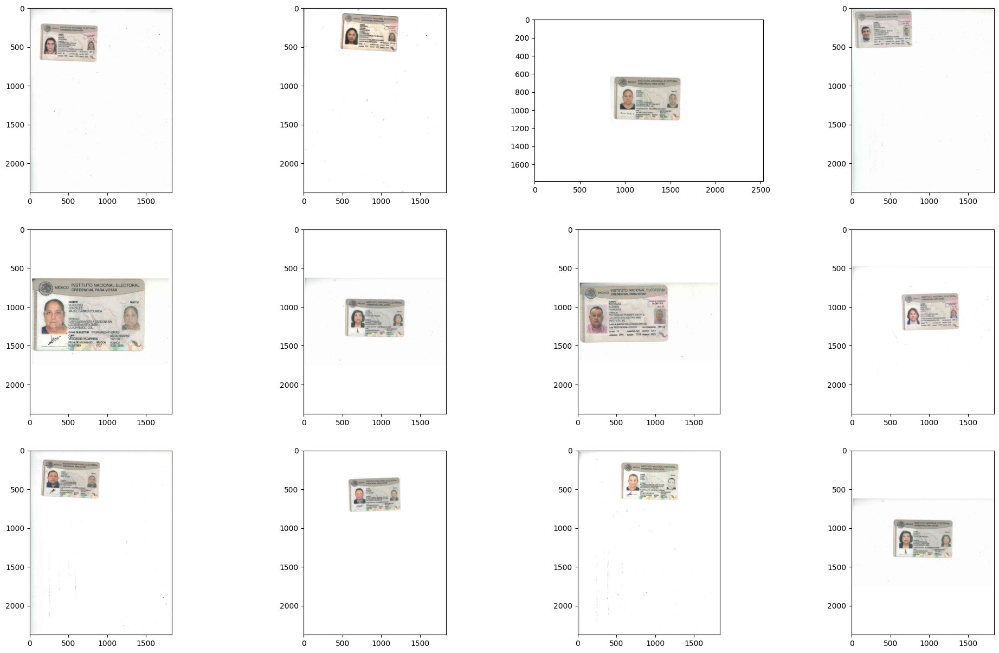

In [54]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

### Example pipeline with one image

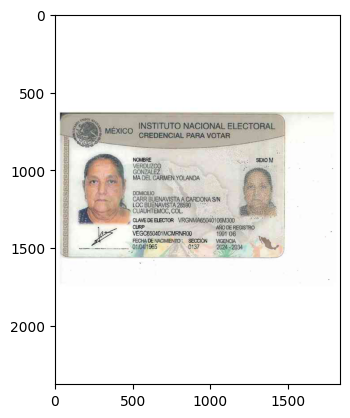

In [55]:
image = images_np[4].copy()

plt.imshow(image, cmap='gray')

Convert to grayscale and perform a median blur to the image

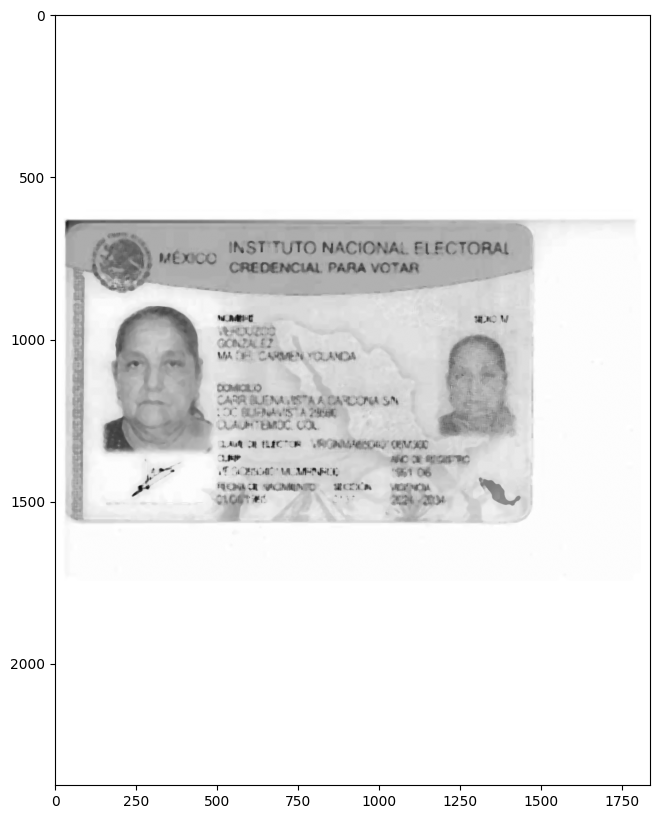

In [56]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
blured = cv2.medianBlur(gray, ksize=11)

plt.figure(figsize=(10,10))
plt.imshow(blured, cmap='gray')

Threshold the image with OTSU and inverse binary

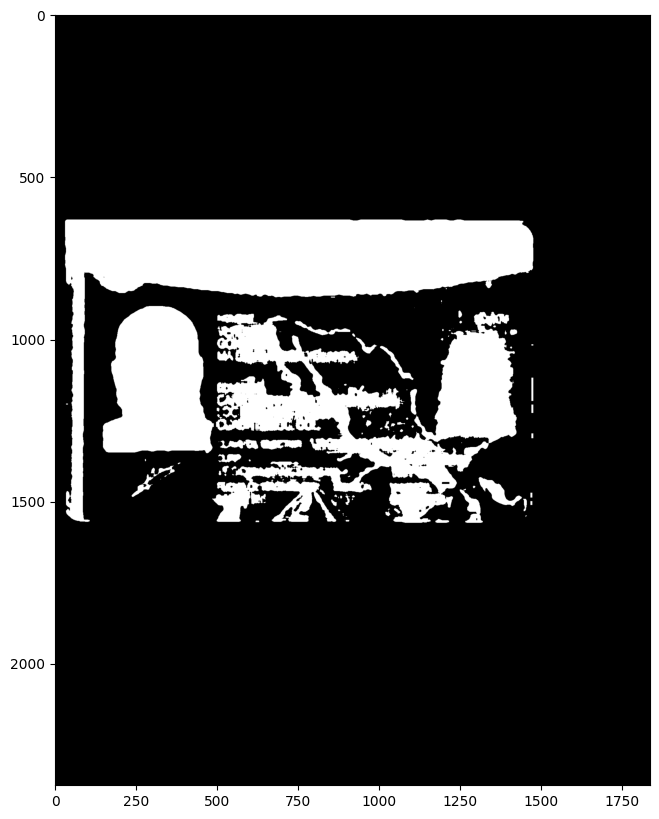

In [57]:
_, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize=(10,10))
plt.imshow(thresh, cmap='gray')

Perform a morphology close operation using a rectangular kernel of 7x7

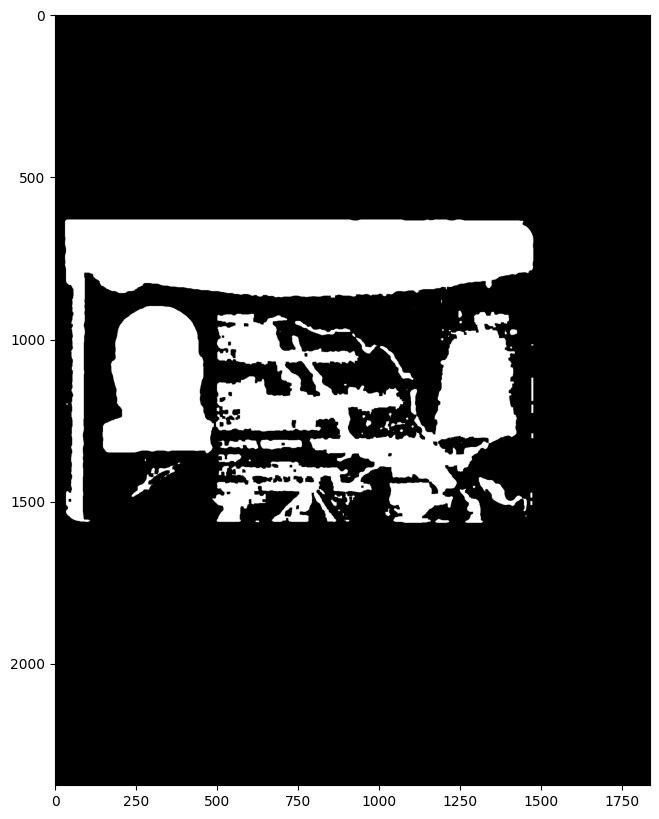

In [58]:
close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel)

plt.figure(figsize=(10,10))
plt.imshow(close, cmap='gray')

Perform a dilate operation using a rectangular kernel of 7x7

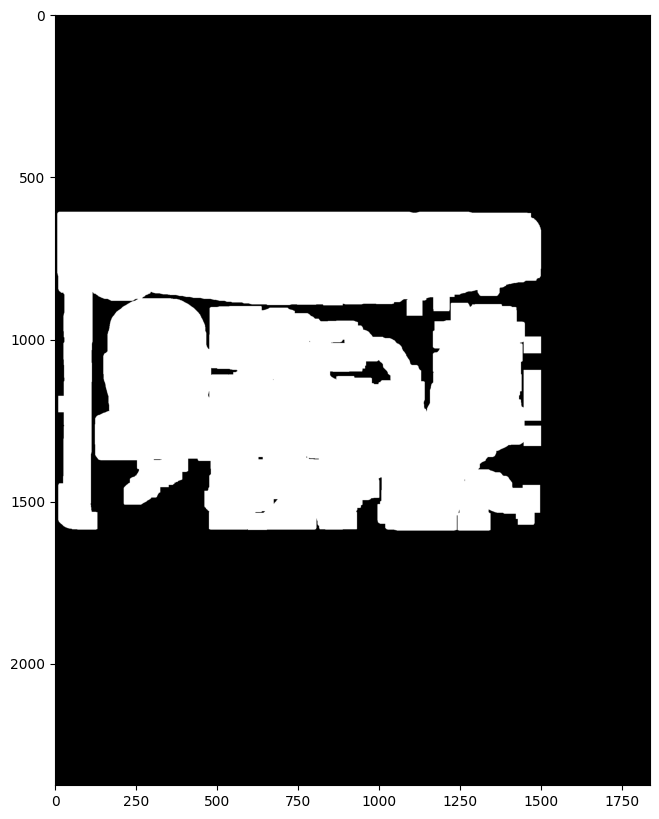

In [59]:
dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
dilate = cv2.dilate(close, dilate_kernel, iterations=8)

plt.figure(figsize=(10,10))
plt.imshow(dilate, cmap='gray')

- Find the contours of the previous image
- Select the largest contour
- Find the bounding rect of the largest contour

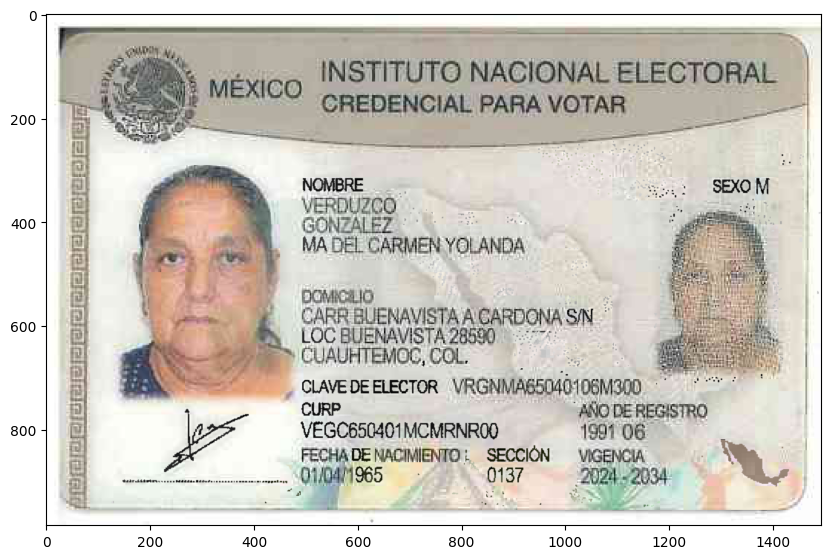

In [60]:
image_contours = image.copy()

contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]

largest_contour = max(contour_areas, key=lambda x: x[1])

rect = cv2.boundingRect(contours[largest_contour[0]])

# cv2.rectangle(image_contours, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0,255,0), 3)

plt.figure(figsize=(10,10))
plt.imshow(image_contours[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]])

Apply the method for all the images

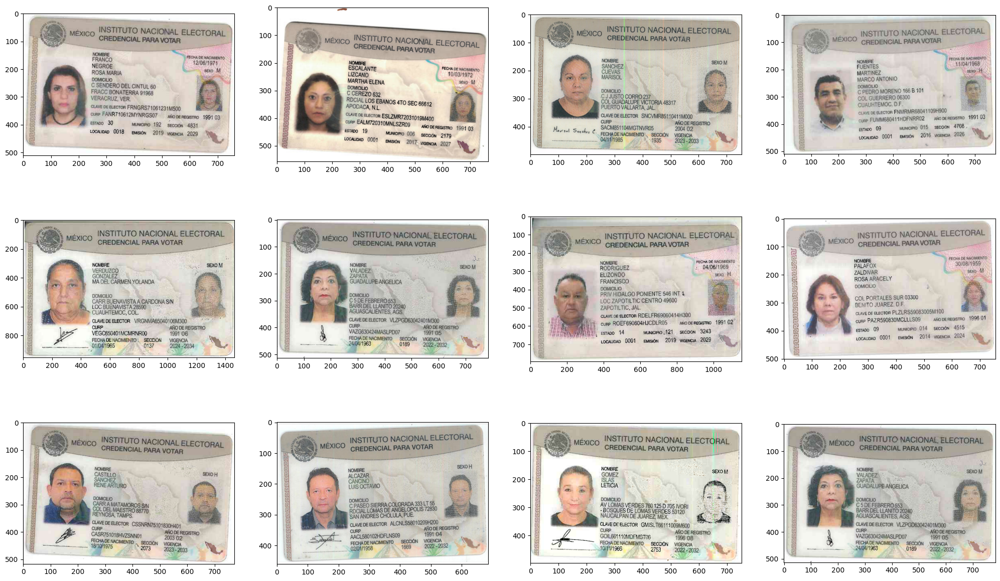

In [61]:
x = math.ceil(math.sqrt(len(images_np)))

cropped_images = []

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

for i, image in enumerate(images_np):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blured = cv2.medianBlur(gray, ksize=11)
    _, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    dilate = cv2.dilate(close, dilate_kernel, iterations=8)

    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]
    largest_contour = max(contour_areas, key=lambda x: x[1])
    rect = cv2.boundingRect(contours[largest_contour[0]])

    cropped = image[rect[1]+15:rect[1]+rect[3]-15, rect[0]+15:rect[0]+rect[2]-15].copy()
    cropped_images.append(cropped)
    
    axs[i].imshow(cropped)

Image size normalization

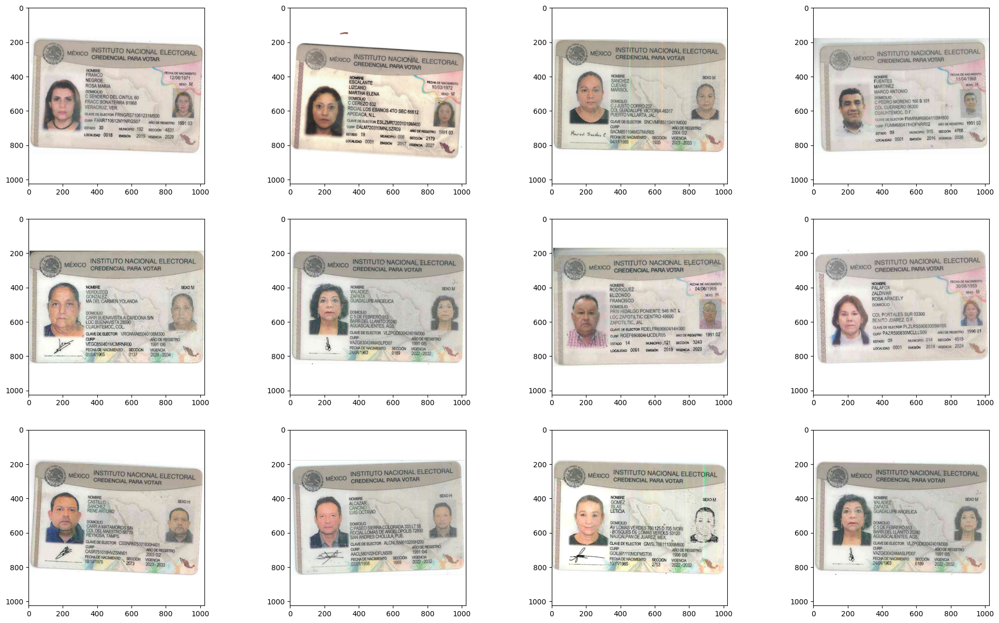

In [62]:
fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

SIZE = 1024

std_images = []

for i, image in enumerate(cropped_images):
    h,w,c = image.shape
    sized = Image.fromarray(image)
    sized = ImageOps.contain(sized, (SIZE, SIZE))
    sized = np.array(sized)
    s_h, s_w, _ = sized.shape

    backgroud = np.ones((SIZE, SIZE, 3), dtype=np.uint8) * 255
    c_y = round((backgroud.shape[0] - s_h) / 2)
    backgroud[c_y:c_y+s_h, 0:0+s_w, :] = sized.copy()

    if not os.path.exists(f'./data/silver/resized/Caso {i}'):
        os.makedirs(f'./data/silver/resized/Caso {i}')

    Image.fromarray(backgroud).save(f"./data/silver/resized/Caso {i}/INE_FRENTE.png", "PNG")

    std_images.append(backgroud)

    axs[i].imshow(backgroud)

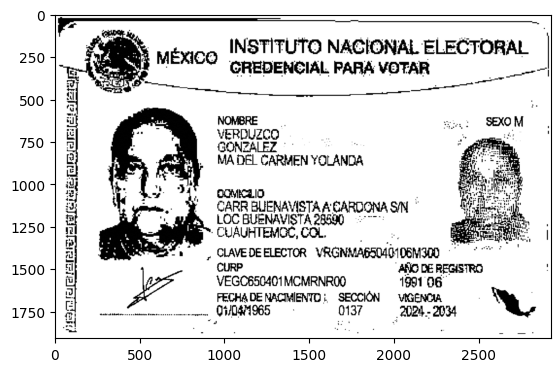

In [114]:
ine_gray = cv2.cvtColor(cropped_images[4], cv2.COLOR_BGR2GRAY)
_, ine_thresh = cv2.threshold(ine_gray, 150, 255, cv2.THRESH_BINARY)
clahe_ine = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8)).apply(ine_thresh)
ine_upscaled = cv2.resize(clahe_ine, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)

plt.imshow(ine_upscaled, cmap='gray')

# Image Analysis (Personal ID back cover)

In [16]:
images_pdfs = glob.glob('./data/bronze/*/INE_REVERSO.pdf')

In [17]:
mat = fitz.Matrix(3, 3)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/INE_REVERSO.png')

In [18]:
images_paths = glob.glob('./data/silver/images/*/INE_REVERSO.png')

In [19]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

Show images in a grid

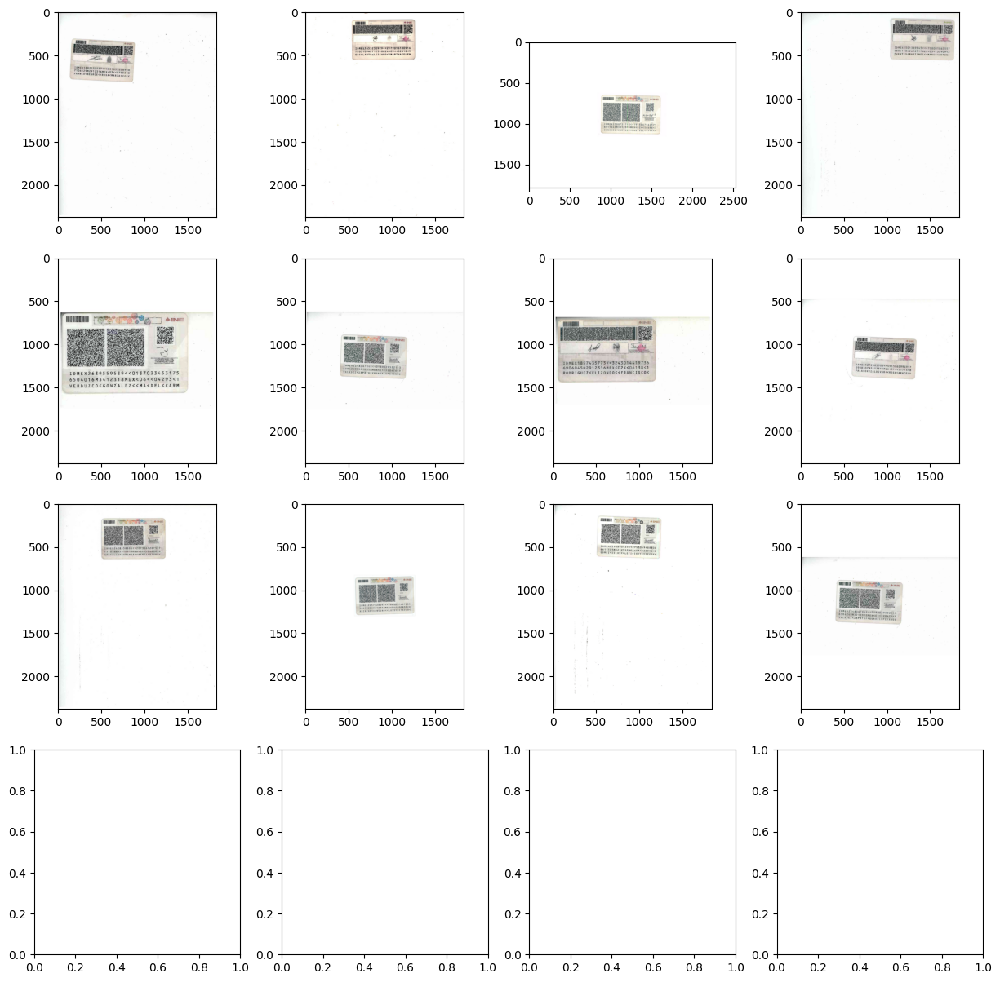

In [20]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x,x, figsize=(15,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

### Example pipeline with one image

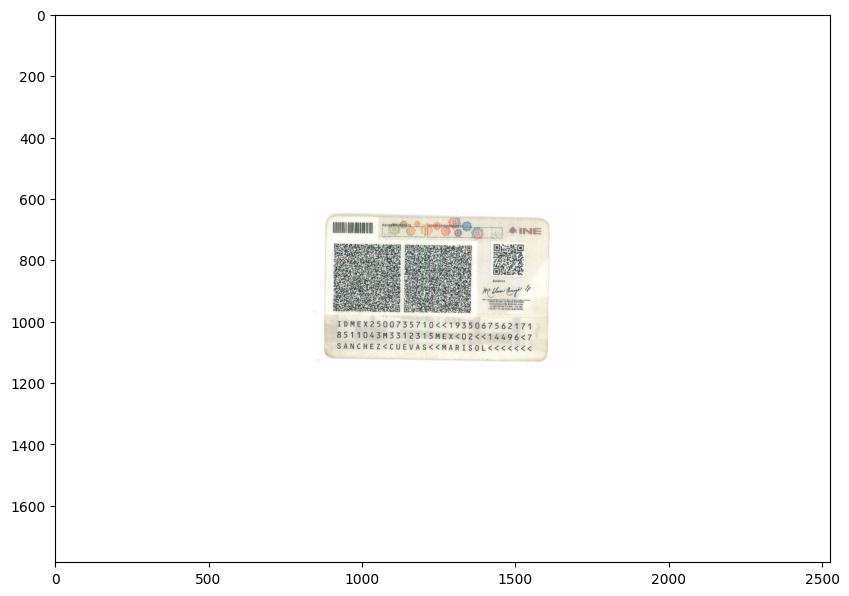

In [21]:
image = images_np[2]

plt.figure(figsize=(10,10))
plt.imshow(image)

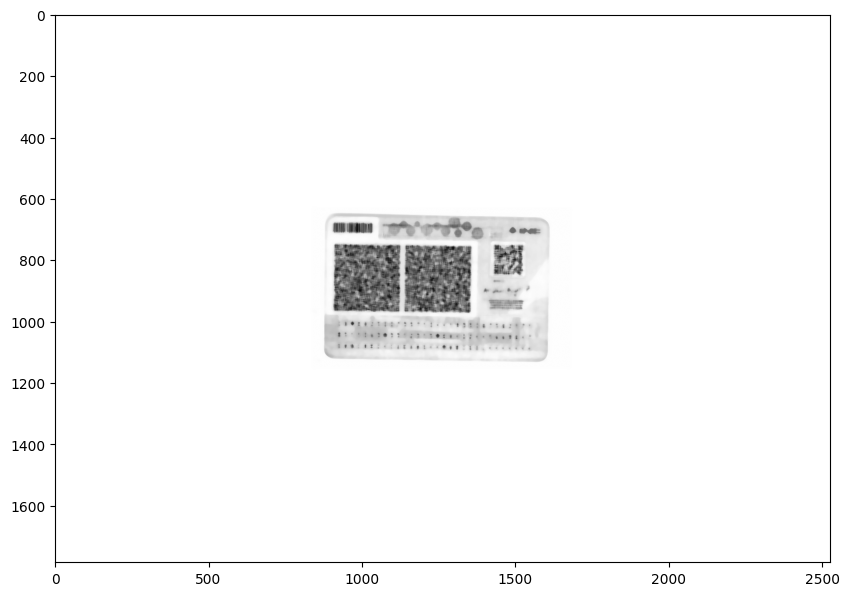

In [22]:
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
blured = cv2.medianBlur(gray, ksize=11)

plt.figure(figsize=(10,10))
plt.imshow(blured, cmap='gray')

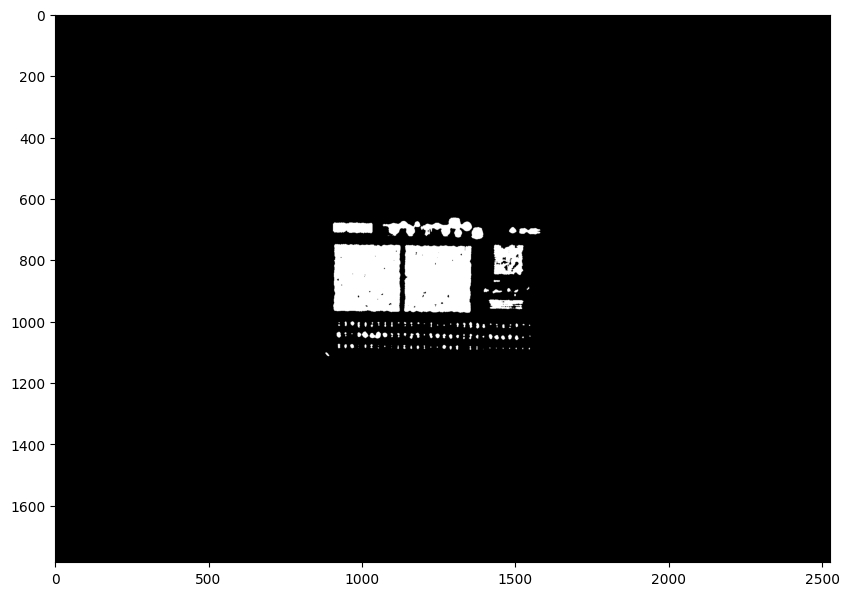

In [23]:
_, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.figure(figsize=(10,10))
plt.imshow(thresh, cmap='gray')

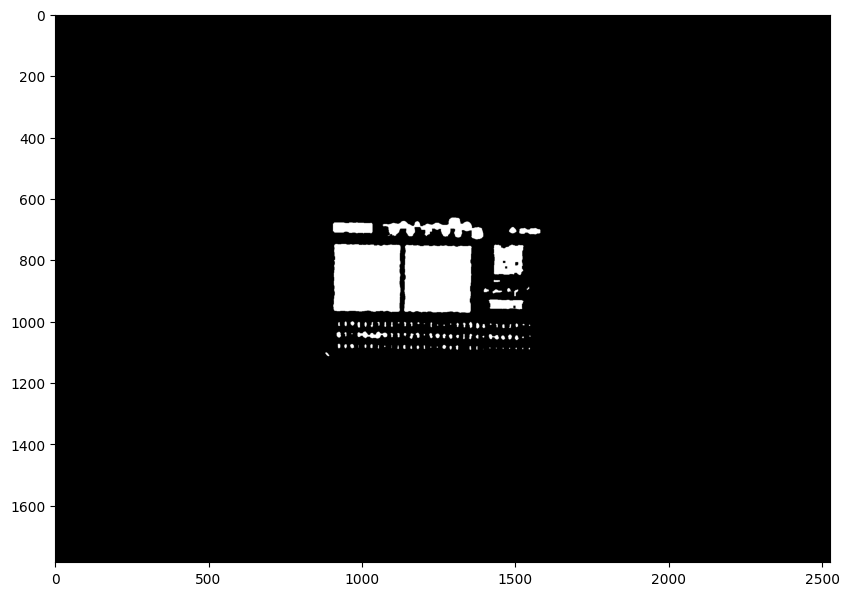

In [24]:
close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel)

plt.figure(figsize=(10,10))
plt.imshow(close, cmap='gray')

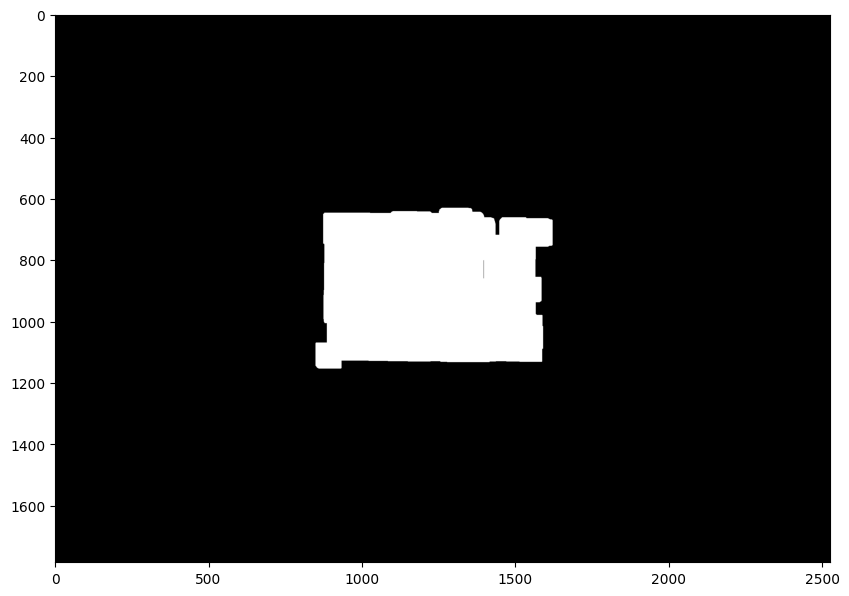

In [25]:
dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,10))
dilate = cv2.dilate(close, dilate_kernel, iterations=8)

plt.figure(figsize=(10,10))
plt.imshow(dilate, cmap='gray')

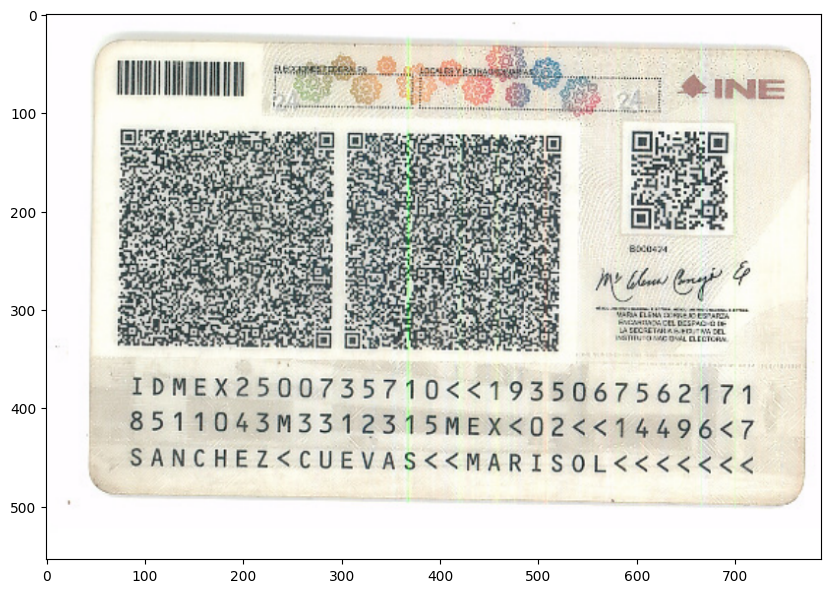

In [26]:
image_contours = image.copy()

contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]

largest_contour = max(contour_areas, key=lambda x: x[1])

rect = cv2.boundingRect(contours[largest_contour[0]])

# for contour in contours:
#     rect = cv2.boundingRect(contour)
#     cv2.rectangle(image_contours, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0,255,0), 2)

plt.figure(figsize=(10,10))
# plt.imshow(image_contours)
plt.imshow(image_contours[rect[1]:rect[1]+rect[3]+30, rect[0]-15:rect[0]+rect[2]])

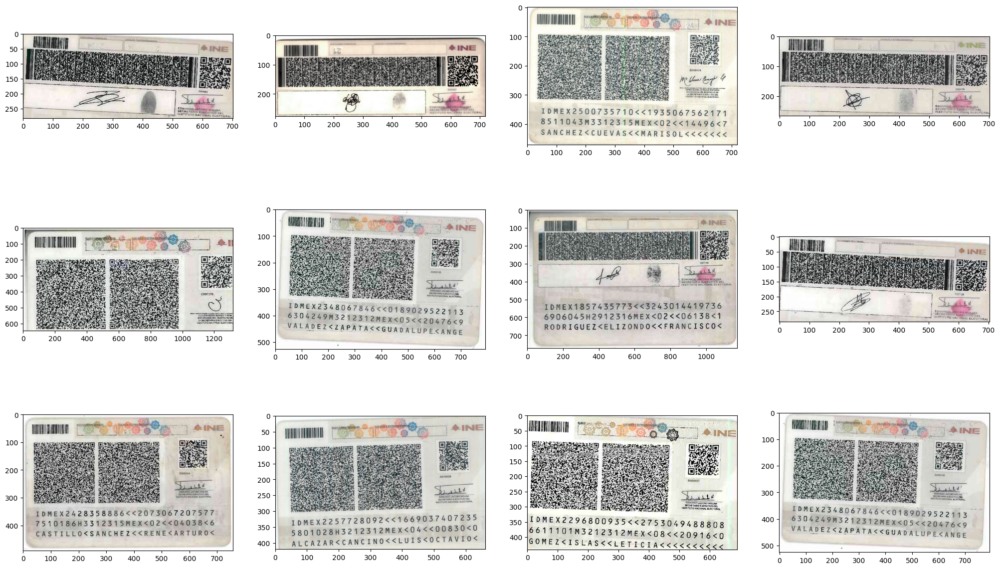

In [27]:
x = math.ceil(math.sqrt(len(images_np)))

cropped_images = []

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

for i, image in enumerate(images_np):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blured = cv2.medianBlur(gray, ksize=11)
    _, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    dilate = cv2.dilate(close, dilate_kernel, iterations=8)

    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_areas = [ (i, cv2.contourArea(contour)) for i, contour in enumerate(contours) ]
    largest_contour = max(contour_areas, key=lambda x: x[1])
    rect = cv2.boundingRect(contours[largest_contour[0]])

    cropped = image[rect[1]+15:rect[1]+rect[3]-15, rect[0]+15:rect[0]+rect[2]-15].copy()
    cropped_images.append(cropped)
    
    axs[i].imshow(cropped)

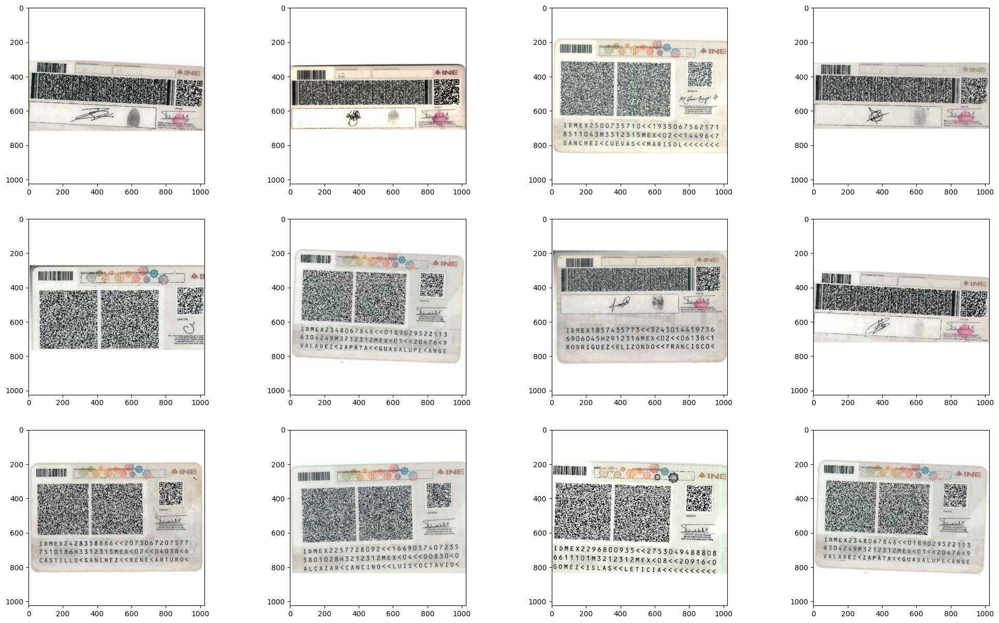

In [28]:
fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()

SIZE = 1024

std_images = []

for i, image in enumerate(cropped_images):
    h,w,c = image.shape
    sized = Image.fromarray(image)
    sized = ImageOps.contain(sized, (SIZE, SIZE))
    sized = np.array(sized)
    s_h, s_w, _ = sized.shape

    backgroud = np.ones((SIZE, SIZE, 3), dtype=np.uint8) * 255
    c_y = round((backgroud.shape[0] - s_h) / 2)
    backgroud[c_y:c_y+s_h, 0:0+s_w, :] = sized.copy()

    Image.fromarray(backgroud).save(f"./data/silver/resized/Caso {i}/INE_REVERSO.png", "PNG")

    std_images.append(backgroud)

    axs[i].imshow(backgroud)

# Image Analysis (Car Invoice)

In [29]:
images_pdfs = glob.glob('./data/bronze/*/FAC_FRENTE.pdf')

In [30]:
mat = fitz.Matrix(5, 5)

for i, pdf_path in enumerate(images_pdfs):
    doc = fitz.open(pdf_path)
    for page in doc:
        pix = page.get_pixmap(matrix=mat)
        name = os.path.basename(pdf_path).replace('.pdf', '')
        path = f'./data/silver/images/Caso {i+1}'
        if not os.path.exists(path):
            os.makedirs(path)
        pix.save(f'{path}/FAC_FRENTE.png')

In [31]:
images_paths = glob.glob('./data/silver/images/*/FAC_FRENTE.png')

In [32]:
images_np = []

for image_path in images_paths:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    images_np.append(image)

[ WARN:0@22.597] global grfmt_png.cpp:695 read_chunk chunk data is too large


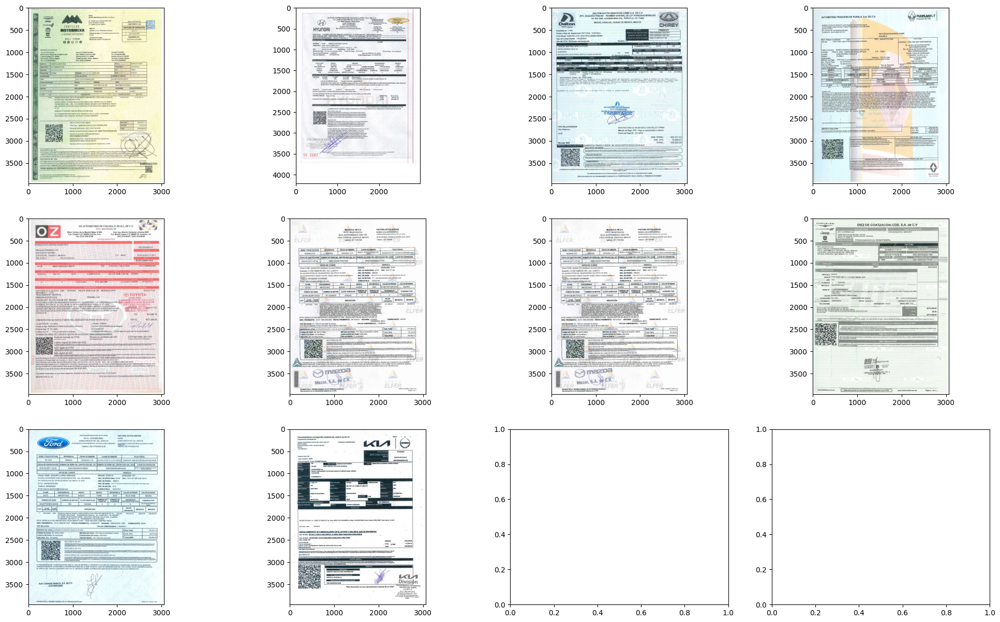

In [33]:
x = math.ceil(math.sqrt(len(images_np)))

fig, axs = plt.subplots(x-1,x, figsize=(25,15))
axs = axs.flatten()
for i, image in enumerate(images_np):
    axs[i].imshow(image)

(<matplotlib.image.AxesImage at 0x37fb06560>, (3960, 3060))

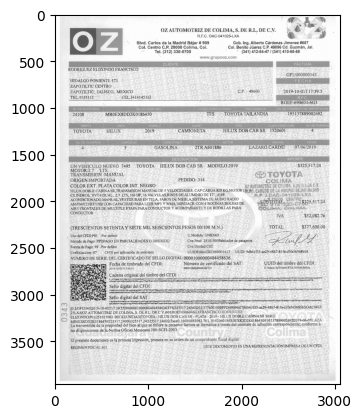

In [34]:
image = cv2.cvtColor(images_np[4].copy(), cv2.COLOR_RGB2GRAY)

plt.imshow(image, cmap='gray'), image.shape

(<matplotlib.image.AxesImage at 0x37fba5e10>, (3960, 3060))

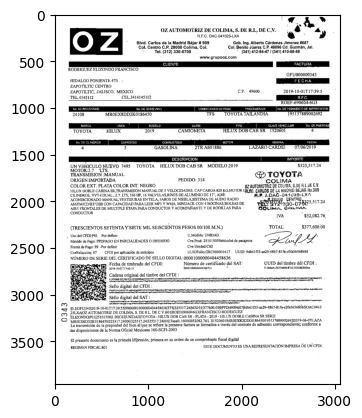

In [35]:
_, image_otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.imshow(image_otsu, cmap='gray'), image.shape

## Extraccion Factura

In [36]:
parsed_text = pyt.image_to_string(image_otsu, lang='spa', output_type=pyt.Output.DICT)
print(parsed_text['text'])

0343

OZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es
R.F.C. OAC-041025-LXA | on o po

> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687
Col. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.
7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88
> wWW.grupooz.com

RODRIGUEZ ELIZONDO FRANCISCO
-GFU000000343

HIDALGO PONIENTE 473 ;
ZAPOTILTIC CENTRO
ZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5
TEL.4145112 CEL.3414145112 o REC.

ROEF-690604-6G3
a. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION
TFS  TOYOTATAILANDIA  -  195137889002692

No. DE INVENTARIO

24108 MR0EX8DD2K0186450

MARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS

TOYOTA " HILUX 2019 CAMIONETA HILUX DOB-CAB SR 1520601 4

COMBUETIBLE MOTOR ADUANA FECHA

2TR A601886. LAZARO CARDE! — :07/06/2019

No DE CILINDROS CAPACIDAD

4 GASOLINA

DESCRIPCIÓN j | IMPORTE

UN VEHICULO NUEVO 7495 TOYOTA HILUX DOB-CAB SR MODELO 2019

In [37]:
model_id = "google/gemma-3-1b-it"

pipe_llm = pipeline(task="text-generation", model=model_id)

Device set to use mps:0


In [38]:
question = "Cual es la marca y modelo del vehiculo?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n

In [39]:
output = pipe_llm(messages)

In [40]:
output[0][0]['generated_text'][-1]

{'role': 'assistant', 'content': 'El vehículo es un Toyota Hilux 2019.'}

In [41]:
question = "Cual es la fecha de compra del vehiculo?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n

In [42]:
output = pipe_llm(messages)

In [43]:
output[0][0]['generated_text']

[{'role': 'system',
  'content': [{'type': 'text',
    'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
 {'role': 'user',
  'content': [{'type': 'text',
    'text': '0343\n\nOZ AUTOMOTRIZ DE COLIMA, $. DE R.L, DE C.Y. LA $ es\nR.F.C. OAC-041025-LXA | on o po\n\n> Blvd. Carlos de la Madrid Béjar H* 909 Gob. Ing. Alberto Cárdenas Jimenez $687\nCol. Centro C.P. 28000 Colima, Col. Col. Benito Júarez C.P. 49096 Cd. Guzmán, Jal.\n7 Tel. (312) 330-0700 * (341) 412-8447 / (341) 410-68-88\n> wWW.grupooz.com\n\nRODRIGUEZ ELIZONDO FRANCISCO\n-GFU000000343\n\nHIDALGO PONIENTE 473 ;\nZAPOTILTIC CENTRO\nZAPOTILTIC; JALISCO, MEXICO C.P. 49600 2019-10-01T17:39:5\nTEL.4145112 CEL.3414145112 o REC.\n\nROEF-690604-6G3\na. DE SERIE 1147) CONDICIONES DE-PÁGO PROCEDENCIA No DE PEDIMENTO DE IMPORTACION\nTFS  TOYOTATAILANDIA  -  195137889002692\n\nNo. DE INVENTARIO\n\n24108 MR0EX8DD2K0186450\n\nMARCA LINEA MODELA FP ELAvE VEHICULAR [Mo DE PUERTAS\n\nTOYO

## Extraccion INE

In [115]:
parsed_text = pyt.image_to_string(ine_upscaled, lang='spa', output_type=pyt.Output.DICT)
print(parsed_text['text'])

0

papa [ent

CP AÑO DE REGISTRO
yd VEGO850401MCMRNROO 1501 06

méxico INSTITUTO NACIONAL ELECTORAL
GREDENCIAL PARA VOTAR a

NOMBRE a

VERDUZLO
GONZALEZ

MA DEL CARMEN YOLANDA

DOMBAIO
CARR BUENA MISTA A LARUONA S/N *
gs LOCBUENAVISTA 28590

Ma” CUAUHTEMOC, COL,

, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO

FECHA DE MACIMIENTO : SECCIÓN — VIGENCIA
mm. OHD4M96S > 0137 2024-20%




In [116]:
question = "Cual es el nombre de la persona?"
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": parsed_text['text']}, {"type": "text", "text": f"{question}"},]
        }
    ],
]
messages

[[{'role': 'system',
   'content': [{'type': 'text',
     'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
  {'role': 'user',
   'content': [{'type': 'text',
     'text': '0\n\npapa [ent\n\nCP AÑO DE REGISTRO\nyd VEGO850401MCMRNROO 1501 06\n\nméxico INSTITUTO NACIONAL ELECTORAL\nGREDENCIAL PARA VOTAR a\n\nNOMBRE a\n\nVERDUZLO\nGONZALEZ\n\nMA DEL CARMEN YOLANDA\n\nDOMBAIO\nCARR BUENA MISTA A LARUONA S/N *\ngs LOCBUENAVISTA 28590\n\nMa” CUAUHTEMOC, COL,\n\n, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO\n\nFECHA DE MACIMIENTO : SECCIÓN — VIGENCIA\nmm. OHD4M96S > 0137 2024-20%\n\n'},
    {'type': 'text', 'text': 'Cual es el nombre de la persona?'}]}]]

In [117]:
output = pipe_llm(messages)

In [118]:
output[0][0]['generated_text']

[{'role': 'system',
  'content': [{'type': 'text',
    'text': 'Eres un asistente servicial, tus respuestas son concisas, si no sabes algo responde no se.'}]},
 {'role': 'user',
  'content': [{'type': 'text',
    'text': '0\n\npapa [ent\n\nCP AÑO DE REGISTRO\nyd VEGO850401MCMRNROO 1501 06\n\nméxico INSTITUTO NACIONAL ELECTORAL\nGREDENCIAL PARA VOTAR a\n\nNOMBRE a\n\nVERDUZLO\nGONZALEZ\n\nMA DEL CARMEN YOLANDA\n\nDOMBAIO\nCARR BUENA MISTA A LARUONA S/N *\ngs LOCBUENAVISTA 28590\n\nMa” CUAUHTEMOC, COL,\n\n, CLAVE DE ELECTOR VRGNMABSOIÓ1 DGMSDO\n\nFECHA DE MACIMIENTO : SECCIÓN — VIGENCIA\nmm. OHD4M96S > 0137 2024-20%\n\n'},
   {'type': 'text', 'text': 'Cual es el nombre de la persona?'}]},
 {'role': 'assistant',
  'content': 'El nombre de la persona es Carmen Yolanda Durvezo.'}]